- This notebook is entirely based on https://www.tensorflow.org/tutorials/images/classification
- https://www.tensorflow.org/tutorials/generative/style_transfer

In [1]:
import os
import numpy as np
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
random_seed = 3093453

#batch_size = 256
batch_size = 128
img_height = 299
img_width = 299

In [3]:
cwd = os.getcwd()
cwd, _ = os.path.split(cwd)
data_dir = os.path.join(cwd, "dataset")
data_dir

'/Users/fynn/Projects/PokeDex/dataset'

In [4]:
# Before gif: 4421 files
# after Gif 135387
# After Downsampling: 18345
# One per gif: 6633
# with tcg: 20808
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.1,
  subset="training",
  seed=random_seed,
  shuffle=True,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.1,
  subset="validation",
  seed=random_seed,
  shuffle=True,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 20810 files belonging to 1006 classes.
Using 18729 files for training.


2024-04-20 19:28:58.857226: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-04-20 19:28:58.857257: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-04-20 19:28:58.857260: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-04-20 19:28:58.857286: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-04-20 19:28:58.857321: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Found 20810 files belonging to 1006 classes.
Using 2081 files for validation.


2024-04-20 19:28:59.542452: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:28:59.543717: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:28:59.775345: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


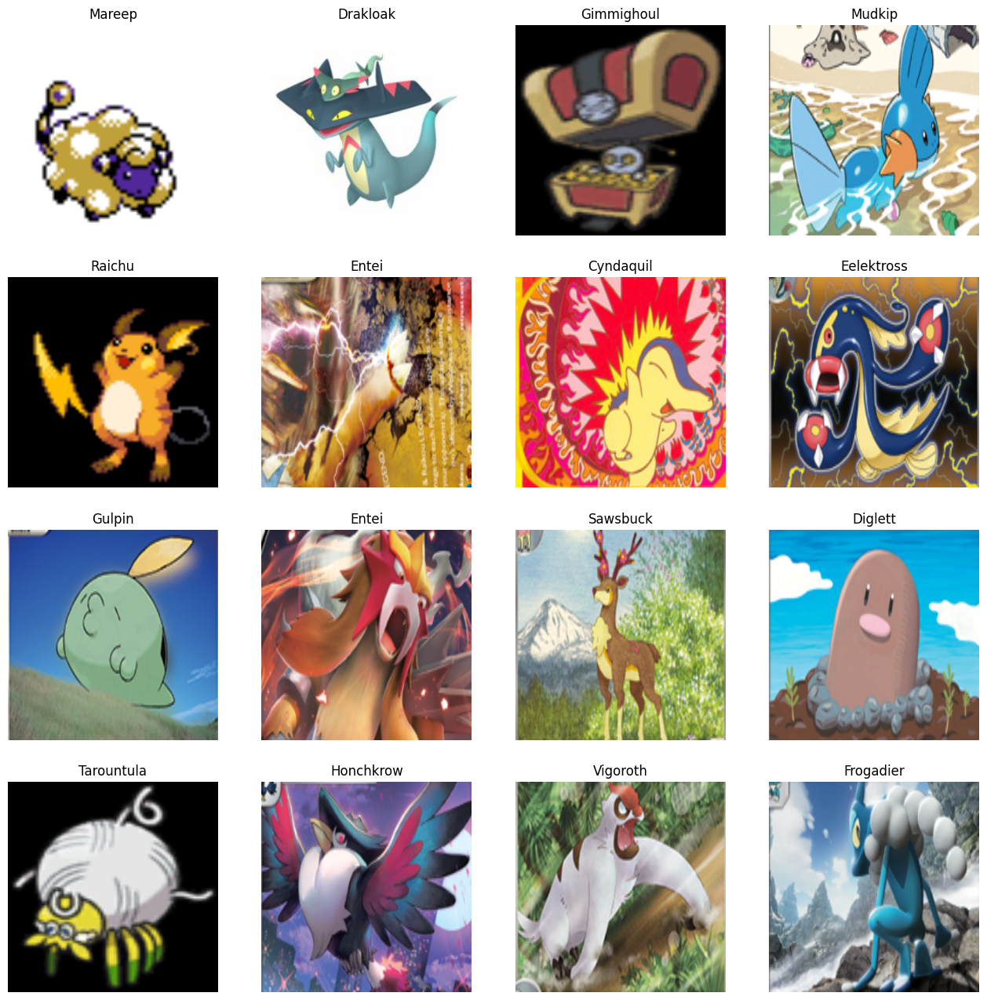

In [5]:
import matplotlib.pyplot as plt

class_names = np.array(train_ds.class_names)


plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [6]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')


In [7]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    
    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim
    new_shape = tf.cast(shape * scale, tf.int32)
    img = tf.image.resize(img, new_shape)
    #img = tf.keras.preprocessing.image.smart_resize(img, (512, 512))
    img = img[tf.newaxis, :]
    return img

In [8]:
import random

context_image_paths = [
    "/Users/fynn/Downloads/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg",
    tf.keras.utils.get_file('kandinsky5.jpg',
                            'https://storage.googleapis.com/download.tensorflow.org/'
                            'example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg'),
]


def style_images_for_upsampling(images, context_image_paths:list[str], probability:float=0.5):
    """
    """
    def decision(probability=probability):
        return random.random() < probability
        

    if not decision():
        #print("No styling")
        return images

    # scale images
    images = images/255

    context_image_path = random.choice(context_image_paths)
    context_image = load_img(context_image_path)

    images = hub_model(images/255, context_image*0.5+0.5)[0]

    images = tf.keras.preprocessing.image.smart_resize(
        images,
        size=(299, 299),
        interpolation='bilinear',
    )
    images = images*255

    return images

    
#hubbed_images = style_images_for_upsampling(images, context_image_paths=context_image_paths)
#hubbed_images

2024-04-20 19:29:03.236436: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:03.239375: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:03.402118: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


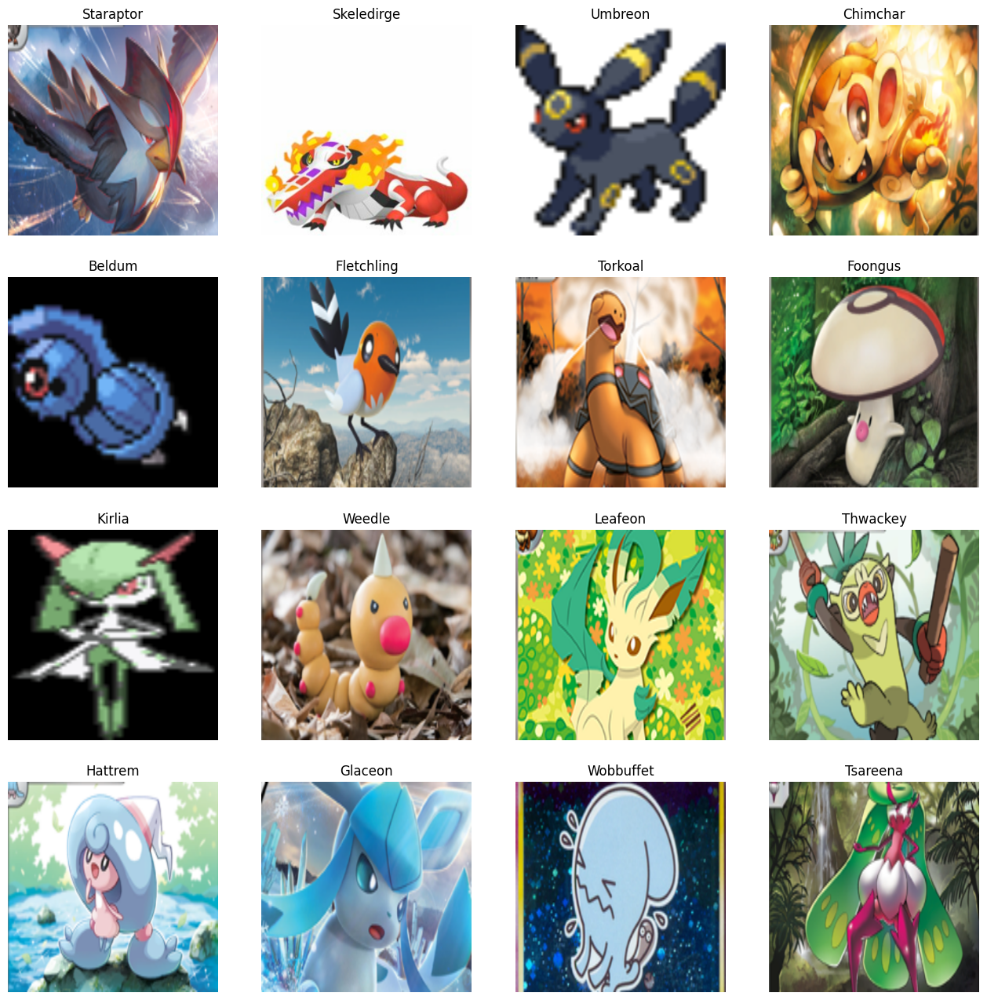

In [9]:
import matplotlib.pyplot as plt

class_names = np.array(train_ds.class_names)


plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

2024-04-20 19:29:04.428432: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:04.431199: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:05.012934: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.
2024-04-20 19:29:14.530720: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


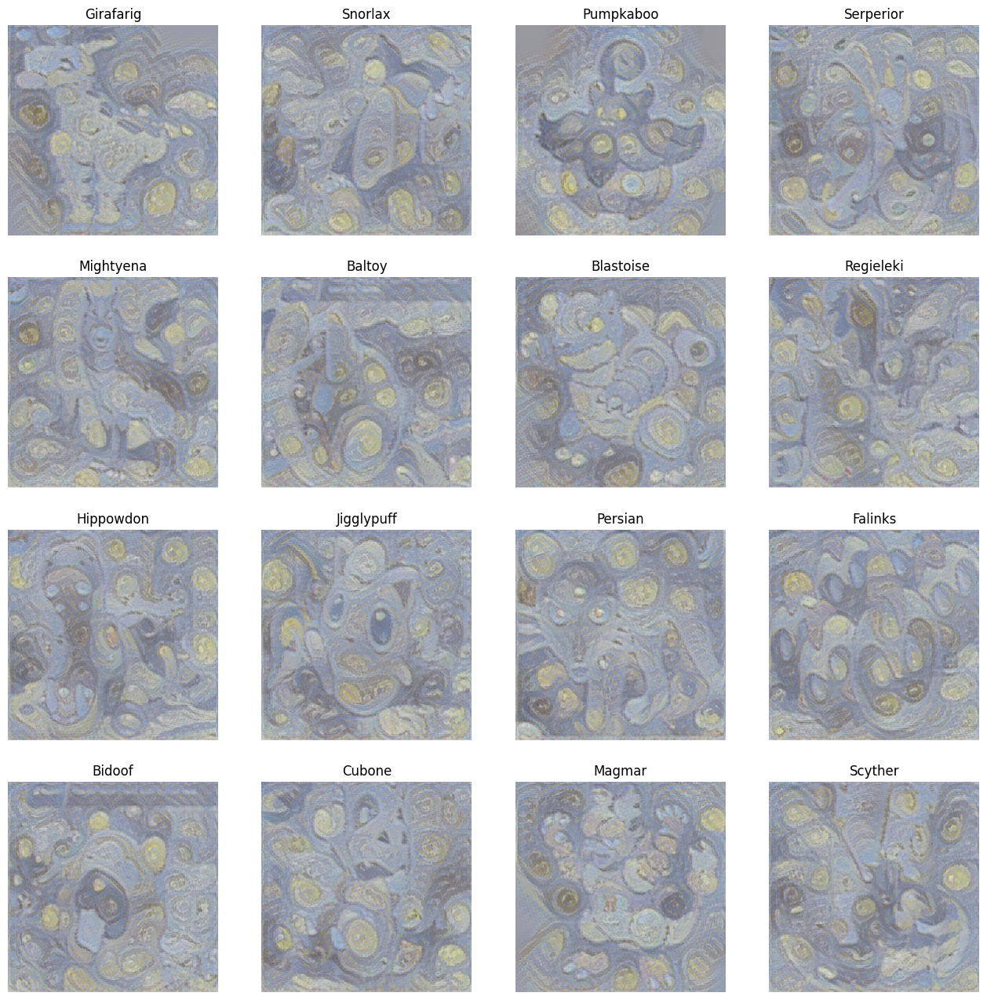

In [10]:
import matplotlib.pyplot as plt

class_names = np.array(train_ds.class_names)


plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
  images = style_images_for_upsampling(images, context_image_paths=context_image_paths, probability=1.0)
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

## Data Augmentation

In [11]:
data_augmentation = keras.Sequential(
  [ 
    layers.RandomTranslation(0.05, 0.05, fill_mode="reflect"),
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    #layers.RandomContrast(0.8),
    #layers.GaussianNoise(0.05)
  ]
)

/Users/fynn/Projects/PokeDex/.venv/lib/python3.11/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2024-04-20 19:29:15.822011: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:15.824874: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:19.877259: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


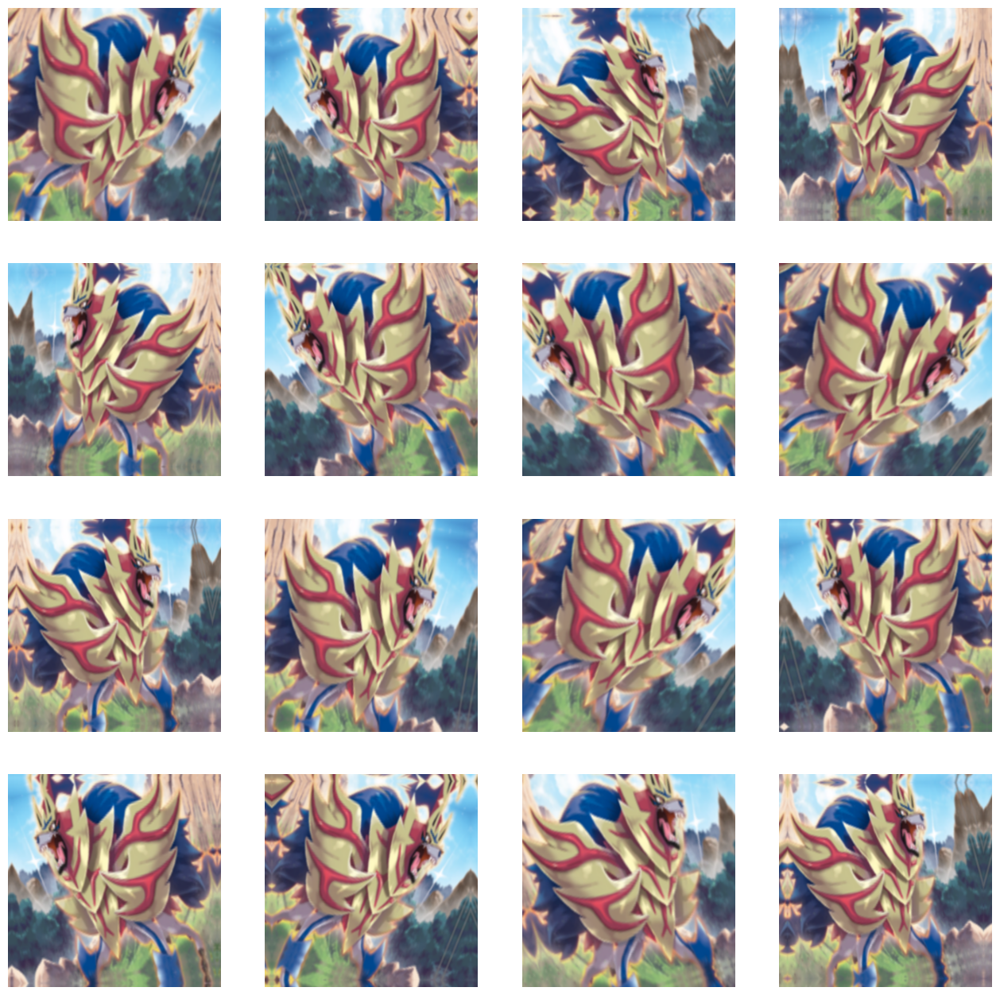

In [12]:
plt.figure(figsize=(16, 16))
for images, _ in train_ds.take(1):
  for i in range(16):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

2024-04-20 19:29:20.907153: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:20.908126: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:24.470920: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


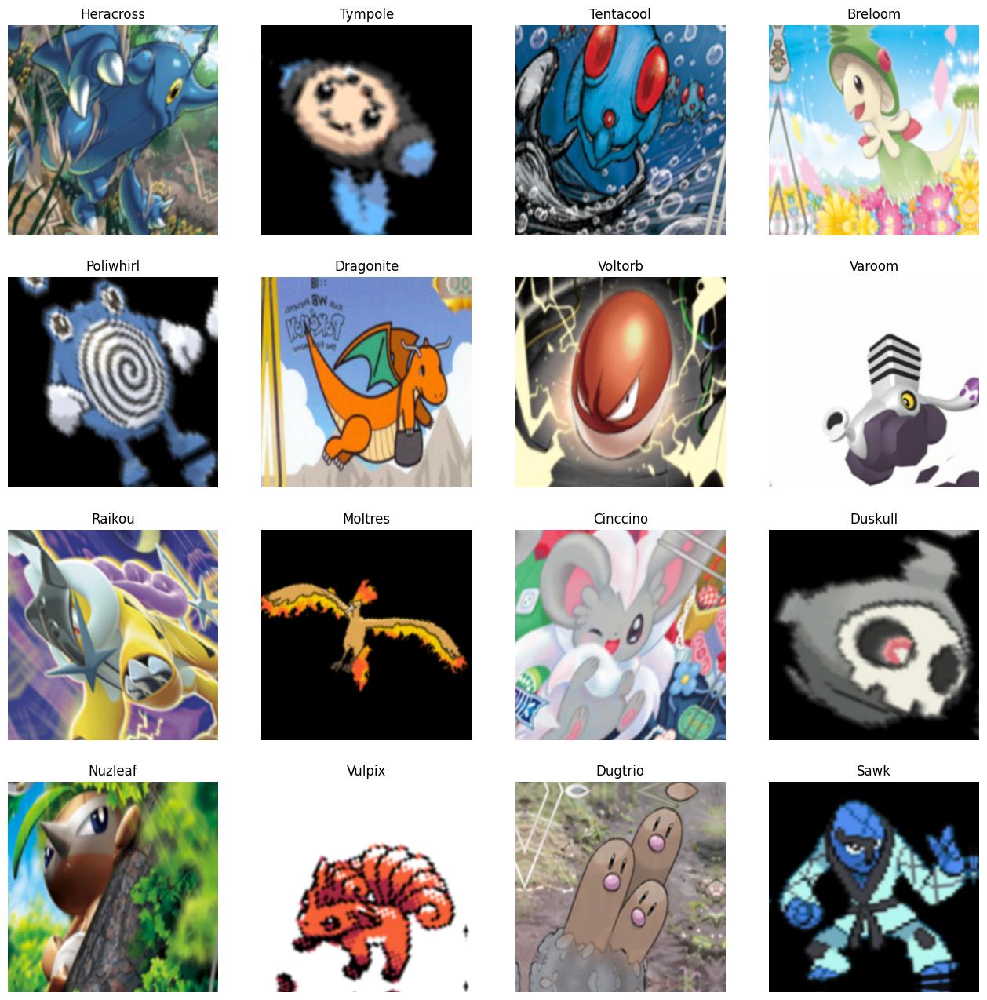

In [13]:
plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    augmented_images = data_augmentation(images)
    plt.imshow(augmented_images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [14]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = (
    train_ds
    .cache()
    .map(lambda x, y: (data_augmentation(x), y),
         num_parallel_calls=tf.data.AUTOTUNE)
    .map(lambda x, y: (style_images_for_upsampling(x,context_image_paths,0.2), y),
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(buffer_size=AUTOTUNE)
)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Model

## metrics

In [15]:
metrics=['accuracy',
         tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name="Top5Accuracy"),
         tf.keras.metrics.SparseTopKCategoricalAccuracy(k=10, name="Top10Accuracy"),
         #tf.keras.metrics.TopKCategoricalAccuracy(k=5, name="Top5Accuracy")
        ]

## Callbacks

In [16]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint

from datetime import datetime

patience = 3
now = datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_log_path = os.path.join(cwd, "logs", "fit", now)
model_save_path = os.path.join(cwd, "models", f"{now}-ImageNet.keras")

print("log_dir: ", tensorboard_log_path)
print("model_path: ", model_save_path)



early_stopping = EarlyStopping(
    monitor='val_loss', patience=patience
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=round(patience/3),
    verbose=1,
)

model_checkpoint = ModelCheckpoint(
    filepath=model_save_path,
    monitor="val_loss",
    verbose=1,
    #save_best_only=True,
    save_best_only=True,
    save_weights_only=False,
    mode="auto",
    save_freq="epoch",
    initial_value_threshold=None,
)

tensor_board = TensorBoard(
    log_dir=tensorboard_log_path,
    histogram_freq=1,
    write_graph=True,
    write_images=True,
    write_steps_per_second=False,
    update_freq='epoch',
    #profile_batch=0,
    #embeddings_freq=0,
    #embeddings_metadata=None
)


callbacks=[early_stopping, lr_scheduler, model_checkpoint, tensor_board]

log_dir:  /Users/fynn/Projects/PokeDex/logs/fit/20240420-192925
model_path:  /Users/fynn/Projects/PokeDex/models/20240420-192925-ImageNet.keras


In [17]:
#!rm -rf ../logs/fit

In [18]:
# Load the TensorBoard notebook extension
#%load_ext tensorboard

In [19]:
#%tensorboard --logdir logs/fit/

## Model Architecture + Compilation

In [20]:
#In your includes
from keras.applications import Xception

#Since you're using the model for a different task, you'd want to remove the top
imagenet = Xception(weights='imagenet', include_top=True)

#Freeze layers 0 to x

for layer in imagenet.layers[:-5]:
    layer.trainable = False

#To see all the layers in detail and to check trainable parameters
#imagenet.summary()

In [21]:
num_classes = len(class_names)

output_layer = layers.Dense(num_classes,
             #activation="softmax",
             name="outputs")

output = output_layer(imagenet.layers[-2].output)

model = tf.keras.Model(
    inputs=imagenet.inputs,
    outputs=output
)

#tf.keras.utils.plot_model(model)

In [22]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              #loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              #loss =tf.keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=metrics
             )

## Model Training

In [ ]:
epochs = 100
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks = callbacks,
)

Epoch 1/100


2024-04-20 19:29:29.176733: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile
2024-04-20 19:29:29.178709: W tensorflow/core/lib/png/png_io.cc:89] PNG warning: iCCP: known incorrect sRGB profile


147/147 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - Top10Accuracy: 0.0516 - Top5Accuracy: 0.0326 - accuracy: 0.0126 - loss: 6.7944
Epoch 1: val_loss improved from inf to 6.58134, saving model to /Users/fynn/Projects/PokeDex/models/20240420-192925-ImageNet.keras
147/147 ━━━━━━━━━━━━━━━━━━━━ 432s 3s/step - Top10Accuracy: 0.0517 - Top5Accuracy: 0.0326 - accuracy: 0.0126 - loss: 6.7935 - val_Top10Accuracy: 0.0750 - val_Top5Accuracy: 0.0514 - val_accuracy: 0.0197 - val_loss: 6.5813 - learning_rate: 0.0010
Epoch 2/100
147/147 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Top10Accuracy: 0.1064 - Top5Accuracy: 0.0676 - accuracy: 0.0259 - loss: 6.2234
Epoch 2: val_loss improved from 6.58134 to 6.41716, saving model to /Users/fynn/Projects/PokeDex/models/20240420-192925-ImageNet.keras
147/147 ━━━━━━━━━━━━━━━━━━━━ 350s 2s/step - Top10Accuracy: 0.1065 - Top5Accuracy: 0.0677 - accuracy: 0.0259 - loss: 6.2229 - val_Top10Accuracy: 0.0961 - val_Top5Accuracy: 0.0577 - val_accuracy: 0.0269 - val_loss: 6.4172 - learning_rate:

In [ ]:
import pandas as pd

df = pd.DataFrame(history.history)

fig, ax = plt.subplots(2, figsize=(16, 16))
df.loc[:,df.columns.str.contains("loss")].plot(ax=ax[0])
df.loc[:,~df.columns.str.contains("loss")].plot(ax=ax[1])

# Predict on new data:

In [ ]:
img_path = "/Users/fynn/Desktop/stat-charizard.png" # charizard
img_path = "/Users/fynn/Desktop/arctincuno.jpg" # arcticuno
img_path = "/Users/fynn/Downloads/Unknown-5" # arcticuno
img_path = "/Users/fynn/Downloads/Unknown-4" # raikou

img = tf.keras.utils.load_img(
    img_path, target_size=(img_height, img_width)
)

img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

In [ ]:
class_names[np.argsort(score)][::-1][:10]

In [ ]:
plt.barh(class_names[np.argsort(score)][-20:], np.sort(score)[-20:]);